# Biomassters competition model data analysis

- Student: Matheus Ventura de Sousa
- Prof. Dr. Antonio José Homsi Goulart.

In this notebook, will be presented a data analysis of the predictions of the 1st and 2nd place models given in [biomassters competition](https://github.com/drivendataorg/the-biomassters). We will show images for satellite S1 SAR and satellite S2 MSI and the predictions associated with each time series. The goal of this visualization is to understand how the data arrangement in the test dataset impact on the Above Ground BioMass prediction.

# 0. Preparing Notebook

In [14]:
import os
import numpy as np
import pandas as pd
import rasterio as rio
import matplotlib.pyplot as plt

ROOT_DIR = './data_test_analysis/'

TEST_FEATURES_DIR_PATH = os.path.join(ROOT_DIR, 'test_features')
PREDS_DIR_PATH = os.path.join(ROOT_DIR, 'preds')
METADATA_PATH = os.path.join(ROOT_DIR, 'features_metadata.csv')
EXPORT_TIME_SERIES_PATH = os.path.join(ROOT_DIR, 'export_time_series')

In [15]:
# If the export time series dir doesn't exist, create it

if not os.path.isdir(EXPORT_TIME_SERIES_PATH):
    os.mkdir(EXPORT_TIME_SERIES_PATH)

## 0.1 Auxiliary Functions

In [16]:
def read_image(image_type: str, filepath: str) -> np.ndarray:
    with rio.open(filepath) as file:
        img = np.array(file.read())
    
    match image_type:
        case "S1":
            """
            Use this link to understand the image interpretation: 
            https://gis.stackexchange.com/questions/400726/creating-composite-rgb-images-from-sentinel-1-channels
            """
            # reshape (3, 256, 256) to (256, 256, 3)
            img = np.transpose(img, (1, 2, 0))

            final_img = np.zeros((256, 256, 3), dtype=np.float32)

            """
            The Biomassters documetation references the image as a log-scale.
            So, we use this encoding to visualize the image:
                R (channel 0): ASC VV
                G (channel 1): ASC VH
                B (channel 2): ASC VV - ASC VH
            """
            final_img[:, :, 0] = img[:, :, 0]
            final_img[:, :, 1] = img[:, :, 1]
            final_img[:, :, 2] = img[:, :, 0] - img[:, :, 1]


            # Normalize the image per-channel with min-max normalization
            for i in range(3):
                v_min = np.percentile(final_img[:, :, i], 0)
                v_max = np.percentile(final_img[:, :, i], 100)

                final_img[:, :, i] = (final_img[:, :, i] - v_min) / (v_max - v_min)

                final_img[:, :, i] = np.clip(final_img[:, :, i] * 255, 0, 255)
            
            img = final_img.astype(np.uint8)
            del final_img
        case "S2":
            """
            Use this link to understand the image interpretation:
            https://en.wikipedia.org/wiki/Sentinel-2
            """

            # Invert from BGR to RGB and reshape from (3, 256, 256) to (256, 256, 3)
            img = np.transpose(img[[2, 1, 0], :, :], (1, 2, 0))

            # Normalize entire image using min-max normalization
            v_min = np.percentile(img, 2)
            v_max = np.percentile(img, 95)

            img = np.clip(((img - v_min) / (v_max - v_min)), 0, 1)

        case "pred":
            img = img.transpose((1, 2, 0))

    return img

In [17]:
def print_test_and_pred_images_model(images, images_preds, df_metadata, chip_id:str, title:str, export: bool = False, filepath_export: str | None = None) -> None:
    fig, axes = plt.subplots(12, 4, figsize=(17, 50), dpi=80)
    
    filled_positions = np.array([[False for _ in range(4)] for _ in range(12)])

    for s1_img_name, s1_img in images[chip_id]["S1"].items():
        idx = int(s1_img_name[-6:-4])
        axes[idx, 0].imshow(s1_img)
        axes[idx, 0].set_title(f"S1 SAR - {df_metadata[df_metadata["filename"] == s1_img_name]['month'].iloc[0]}" , fontsize=18)
        filled_positions[idx, 0] = True


    for s2_img_name, s2_img in images[chip_id]["S2"].items():
        idx = int(s2_img_name[-6:-4])
        axes[idx, 1].imshow(s2_img)
        axes[idx, 1].set_title(f"S2 MSI - {df_metadata[df_metadata["filename"] == s2_img_name]['month'].iloc[0]}", fontsize=18)
        filled_positions[idx, 1] = True


    for i in range(12):
        axes[i, 2].imshow(images_preds[chip_id]['1st-place'])
        axes[i, 3].imshow(images_preds[chip_id]['2nd-place'])
        if i == 0:
            axes[i, 2].set_title("AGBM - Modelo 1" , fontsize=18)
            axes[i, 3].set_title("AGBM - Modelo 2" , fontsize=18)
        filled_positions[i, 2] = True
        filled_positions[i, 3] = True
    
    for i in range(len(filled_positions)):
        for j in range(len(filled_positions[0])):
            if not filled_positions[i, j]:
                axes[i, j].set_xlim(0, 0.5)
                axes[i, j].set_ylim(0, 0.5)

    plt.suptitle(title, fontsize=23)
    plt.tight_layout(pad=5)
    
    if export:
        assert isinstance(filepath_export, str), "You must provide a path to save the plot"
        plt.savefig(filepath_export)
        plt.close()
    else:
        plt.show()

## 0.2 Loading Metadata

In [32]:
df_metadata = pd.read_csv(METADATA_PATH)
df_metadata_total = df_metadata.copy()

# obtaining only the test part of the dataset
df_metadata = df_metadata[df_metadata['split'] == 'test'].drop(columns=['s3path_us', 's3path_eu', 's3path_as', 'cksum', 'size'])

In [33]:
print(f"number of unique chip-ids in all metadata: {df_metadata_total['chip_id'].nunique()}")
print(f"number of unique chip-ids in test metadata: {df_metadata['chip_id'].nunique()}")

number of unique chip-ids in all metadata: 11462
number of unique chip-ids in test metadata: 2773


In [34]:
df_metadata[df_metadata['satellite'] == "S2"].head()

,filename,chip_id,satellite,split,month,corresponding_agbm
534,00a28320_S2_00.tif,00a28320,S2,test,September,00a28320_agbm.tif
535,00a28320_S2_01.tif,00a28320,S2,test,October,00a28320_agbm.tif
536,00a28320_S2_02.tif,00a28320,S2,test,November,00a28320_agbm.tif
537,00a28320_S2_04.tif,00a28320,S2,test,January,00a28320_agbm.tif
538,00a28320_S2_05.tif,00a28320,S2,test,February,00a28320_agbm.tif


In [36]:
# Checking unique values of starting month of all time series images
df_metadata[(df_metadata['filename'].str.contains('00.tif'))]['month'].unique()

array(['September'], dtype=object)

## 1. Loading Images

/home/matheus/anaconda3/lib/python3.13/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


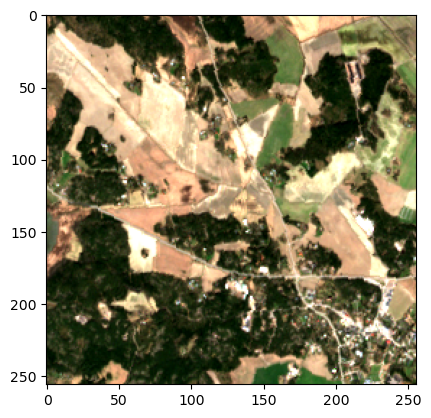

In [37]:
# S2 Image Example

plt.imshow(read_image("S2", os.path.join(TEST_FEATURES_DIR_PATH, '00a28320_S2_08.tif')))

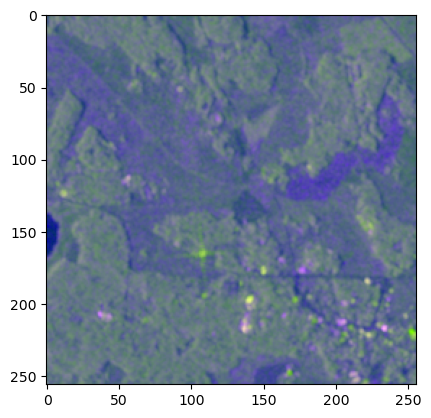

In [38]:
# S1 Image Example

plt.imshow(read_image("S1", os.path.join(TEST_FEATURES_DIR_PATH, '00a28320_S1_00.tif')))

In this section, we will get a sample of 3 time series images and show the satellite imagery and the predictions made by the 1st and 2nd place models.

In [39]:
# Reading Images from a sample of 3 chip-ids 

images = {
    chip_id: {
        "S1": {
            filename: read_image("S1", os.path.join(TEST_FEATURES_DIR_PATH, filename)) for filename in df_metadata['filename'] if chip_id.lower() + "_s1" in filename.lower()
        },
        "S2": {
            filename: read_image("S2", os.path.join(TEST_FEATURES_DIR_PATH, filename)) for filename in df_metadata['filename'] if chip_id.lower() + "_s2" in filename.lower()
        }
    } 
    for chip_id in df_metadata['chip_id'].unique()[:3]
}

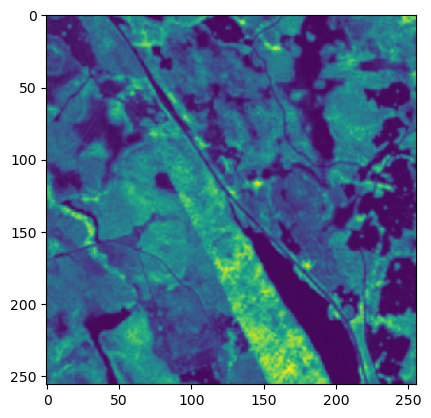

In [40]:
# Example of 1st-place model prediction

img = read_image("pred", os.path.join(PREDS_DIR_PATH, "1st-place", "0a2d4cec_agbm.tif"))
plt.imshow(img)

In [41]:
# Getting all filepaths for sampled chip-ids

preds_1st_place_images_filepath = { chip_id: os.path.join(PREDS_DIR_PATH, "1st-place", filepath) for filepath in os.listdir(os.path.join(PREDS_DIR_PATH, "1st-place")) for chip_id in images if chip_id in filepath  }
preds_2nd_place_images_filepath = { chip_id: os.path.join(PREDS_DIR_PATH, "2nd-place", filepath) for filepath in os.listdir(os.path.join(PREDS_DIR_PATH, "2nd-place")) for chip_id in images if chip_id in filepath }

# Reading all prediction images for 1st-place and 2nd-place model

images_preds = {
    chip_id: {
        "1st-place": read_image("pred", preds_1st_place_images_filepath[chip_id]),
        "2nd-place": read_image("pred", preds_2nd_place_images_filepath[chip_id])
    }

    for chip_id in images
}


In [42]:
valid_chip_ids = [chip_id for chip_id in images]
valid_chip_ids

['00a28320', '01047f47', '0128a38e']

# 2. Predicting AGBM

This section will show the AGBM Prediction for first and second place models using the chip-id sample selected in the section above.

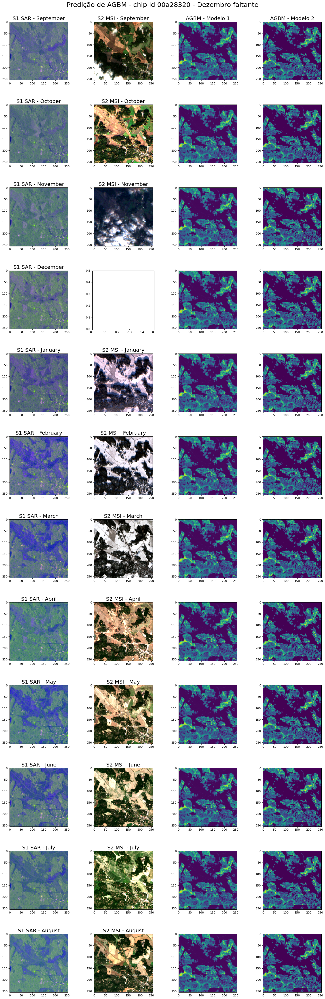

In [43]:
title = f"Predição de AGBM - chip id {valid_chip_ids[0]} - Dezembro faltante"

print_test_and_pred_images_model(images, images_preds, df_metadata, valid_chip_ids[0], title)

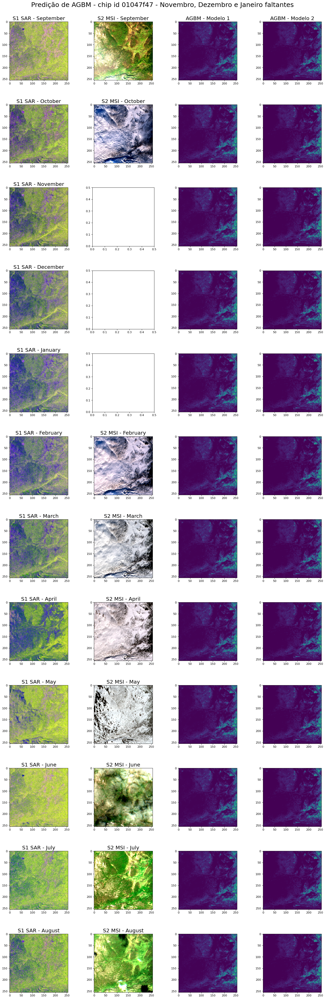

In [44]:
title = f"Predição de AGBM - chip id {valid_chip_ids[1]} - Novembro, Dezembro e Janeiro faltantes"
print_test_and_pred_images_model(images, images_preds, df_metadata, valid_chip_ids[1], title)

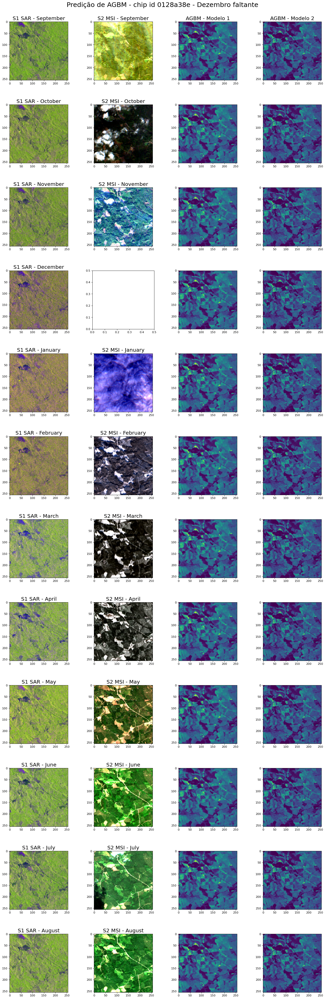

In [45]:
title = f"Predição de AGBM - chip id {valid_chip_ids[2]} - Dezembro faltante"
print_test_and_pred_images_model(images, images_preds, df_metadata, valid_chip_ids[2], title)

## 3. Missing S2 Images Analysis

As reported in the [Biomassters Competition Paper](https://openreview.net/pdf?id=hrWsIC4Cmz), some images from satellite S2 MSI were discarded because, as the image has a channel indicating a mask of clouds interfering in the image capturing, the competition choose to cut off the images which had a cloud mask with high density. 

The purpose with this section is to discover if the missing images affect in the prediction of the 1st and 2nd models. We will use a sample of images to perform this task.

Total number of images for each month = 2773


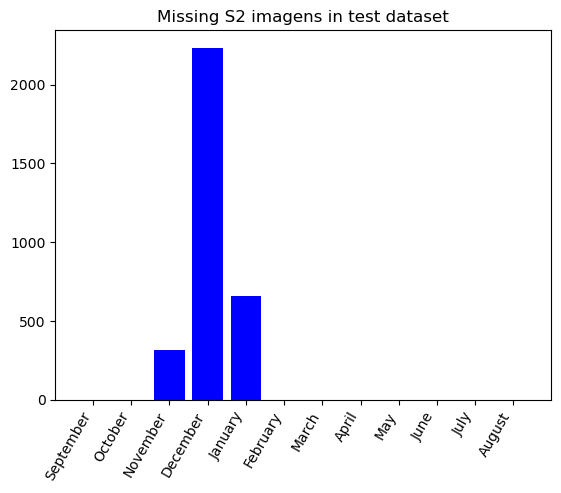

In [20]:
num_chip_ids = df_metadata['chip_id'].nunique()
months = df_metadata['month'].unique()

print(f"Total number of images for each month = {num_chip_ids}")

missing_s2_img_hist = { month: num_chip_ids - len(df_metadata[(df_metadata['satellite'] == "S2") & (df_metadata['month'] == month)]) for month in months }

plt.bar(missing_s2_img_hist.keys(), missing_s2_img_hist.values(), color='b')
plt.title("Missing S2 imagens in test dataset")
plt.xticks(rotation=60, ha='right')
plt.show()

As expected, December has the greatest amount of missing S2 Images given that period relative to December month in Finland is winter which is the period with most amount of clouds. November and January are also Winter in Finland but there's much less missing images because it is respective to beginning (November) and ending (January).

In later sections, we will collect the missing S2 MSI Images following this pattern:
  - Time series with all images present.
  - Time Series missing only one month (November, December or January).
  - Time Series missing two months consecutively (November and December or December and January).
  - Time Series missing all three months (November, December and January).
  - If there's some cases that don't fit in anyone else, we put it as problematic cases.

In [46]:
chip_id_missing = {
    'NovDecJan': [],
    'NovDec': [],
    'DecJan':[],
    'Nov': [],
    'Dec': [],
    'Jan': [],
    'AllPresent': [],
    'Casos Problematicos': []
}

block_chip_ids = {
    'NovDecJan': ('01e343cf', '079de383', '09179ac0'),
    'DecJan':('03d1b011', ),
    'Dec': ('01d74a63', ),
    'AllPresent': ('02fb2883', '04b4be2b', '031c6894', '0452be20', '03253d45')
}


for chip_id in df_metadata['chip_id'].unique():
    filenames = df_metadata[(df_metadata['chip_id'] == chip_id) & (df_metadata['satellite'] == 'S2')]['filename']
    present_months = 0b000000000000

    for filename in filenames:
        present_months |= 0b1 << int(filename[-6:-4])
    
    field = 'NovDecJan'  if present_months == 0b111111100011 and chip_id not in block_chip_ids['NovDecJan']   and len(chip_id_missing['NovDecJan']) < 10   else \
            'NovDec'     if present_months == 0b111111110011 and chip_id not in block_chip_ids['NovDec']      and len(chip_id_missing['NovDec']) < 10      else \
            'DecJan'     if present_months == 0b111111100111 and chip_id not in block_chip_ids['DecJan']      and len(chip_id_missing['DecJan']) < 10      else \
            'Nov'        if present_months == 0b111111111011 and chip_id not in block_chip_ids['Nov']         and len(chip_id_missing['Nov']) < 10         else \
            'Dec'        if present_months == 0b111111110111 and chip_id not in block_chip_ids['Dec']         and len(chip_id_missing['Dec']) < 10         else \
            'Jan'        if present_months == 0b111111101111 and chip_id not in block_chip_ids['Jan']         and len(chip_id_missing['Jan']) < 10         else \
            'AllPresent' if present_months == 0b111111111111 and chip_id not in block_chip_ids['AllPresent']  and len(chip_id_missing['AllPresent']) < 10  else None

    if field:
        chip_id_missing[field].append(chip_id)
    
chip_id_missing = {k: v for k, v in chip_id_missing.items() if len(v)}
chip_id_missing['Casos Problematicos'] = [chip_id for missing_month in block_chip_ids for chip_id in block_chip_ids[missing_month]]

chip_id_missing

{'NovDecJan': ['01047f47',
  '0215f36c',
  '03b4500a',
  '03d2248c',
  '058eb8d1',
  '0643d09d',
  '0753cbce',
  '075f8b76',
  '0a059404',
  '0a9bb57d'],
 'DecJan': ['047bd278',
  '0491e532',
  '05a2ca49',
  '0684737e',
  '071abf38',
  '0782d23f',
  '07e48228',
  '07fc7e09',
  '0893ce76',
  '08d49e32'],
 'Dec': ['00a28320',
  '0128a38e',
  '0169bbe3',
  '0189741b',
  '01ad8a71',
  '01f808cb',
  '01fff88d',
  '0203607d',
  '023081a4',
  '0248148e'],
 'AllPresent': ['01931f13',
  '02073a85',
  '025109d9',
  '038c87e4',
  '03dfc9f4',
  '04446d4b',
  '0471ca6b',
  '050699ab',
  '05617f0f',
  '05e15988'],
 'Casos Problematicos': ['01e343cf',
  '079de383',
  '09179ac0',
  '03d1b011',
  '01d74a63',
  '02fb2883',
  '04b4be2b',
  '031c6894',
  '0452be20',
  '03253d45']}

One note to mention: As getting and filtering the chip_ids by category as proposed above. Some categories doesn't have chip_ids as:
  - Only missing November
  - Only missing January
  - Missing November and December

In consecutive cells, we will read the images and store the plot in files to be viewed later.

In [47]:
chip_ids_combined = []

chip_ids_combined.extend(chip_ids for missing_field in chip_id_missing for chip_ids in chip_id_missing[missing_field])

images = {
    chip_id: {
        "S1": {
            filename: read_image("S1", os.path.join(TEST_FEATURES_DIR_PATH, filename)) for filename in df_metadata['filename'] if chip_id.lower() + "_s1" in filename.lower()
        },
        "S2": {
            filename: read_image("S2", os.path.join(TEST_FEATURES_DIR_PATH, filename)) for filename in df_metadata['filename'] if chip_id.lower() + "_s2" in filename.lower()
        }
    } 
    for chip_id in chip_ids_combined
}


/tmp/ipykernel_8644/1001228399.py:52: RuntimeWarning: divide by zero encountered in divide
  img = np.clip(((img - v_min) / (v_max - v_min)), 0, 1)
/tmp/ipykernel_8644/1001228399.py:52: RuntimeWarning: invalid value encountered in divide
  img = np.clip(((img - v_min) / (v_max - v_min)), 0, 1)


In [48]:
# Getting all filepaths for sampled chip-ids

preds_1st_place_images_filepath = { chip_id: os.path.join(PREDS_DIR_PATH, "1st-place", filepath) for filepath in os.listdir(os.path.join(PREDS_DIR_PATH, "1st-place")) for chip_id in images if chip_id in filepath  }
preds_2nd_place_images_filepath = { chip_id: os.path.join(PREDS_DIR_PATH, "2nd-place", filepath) for filepath in os.listdir(os.path.join(PREDS_DIR_PATH, "2nd-place")) for chip_id in images if chip_id in filepath }

# Reading all prediction images for 1st-place and 2nd-place model

images_preds = {
    chip_id: {
        "1st-place": read_image("pred", preds_1st_place_images_filepath[chip_id]),
        "2nd-place": read_image("pred", preds_2nd_place_images_filepath[chip_id])
    }

    for chip_id in images
}

In [49]:
if not os.path.isdir(os.path.join(EXPORT_TIME_SERIES_PATH, 'pdf')):
    os.mkdir(os.path.join(EXPORT_TIME_SERIES_PATH, 'pdf'))

for missing_months in chip_id_missing:

    if not os.path.isdir(os.path.join(EXPORT_TIME_SERIES_PATH, 'pdf', missing_months)):
        os.mkdir(os.path.join(EXPORT_TIME_SERIES_PATH, 'pdf', missing_months))


    for chip_id in chip_id_missing[missing_months]:
        missing_months_list = []

        if 'Nov' in missing_months:
            missing_months_list.append('Novembro')
        if 'Dec' in missing_months:
            missing_months_list.append('Dezembro')
        if 'Jan' in missing_months:
            missing_months_list.append('Janeiro')

        title = f"Predição de AGBM - chip id {chip_id} - {"Caso Problemático" if missing_months == 'Casos Problematicos' else 'sem meses' if missing_months == 'AllPresent' else f'{', '.join(missing_months_list[:-1])}{' e ' if len(missing_months_list) > 1 else ''}{missing_months_list[-1]}'}{'' if missing_months == 'Casos Problematicos' else ' faltantes' if len(missing_months_list) != 1 else ' faltante'}"

        print_test_and_pred_images_model(images, images_preds, df_metadata, chip_id, title, export=True, filepath_export=os.path.join(EXPORT_TIME_SERIES_PATH, 'pdf', missing_months, f'pred-{chip_id}-{missing_months}.pdf'))